## Training using YOLOV8m

In [ ]:
!pip install ultralytics
#installing the YOLOv8 model
from ultralytics import YOLO
import os
from IPython.display import display, Image
from IPython import display
display.clear_output()
!yolo mode = checks

Traceback (most recent call last):
  File "/usr/local/bin/yolo", line 8, in <module>
    sys.exit(entrypoint())
  File "/usr/local/lib/python3.10/dist-packages/ultralytics/cfg/__init__.py", line 649, in entrypoint
    raise ValueError(f"Invalid 'mode={mode}'. Valid modes are {MODES}.\n{CLI_HELP_MSG}")
ValueError: Invalid 'mode=<module 'ultralytics.utils.checks' from '/usr/local/lib/python3.10/dist-packages/ultralytics/utils/checks.py'>'. Valid modes are {'predict', 'benchmark', 'export', 'train', 'val', 'track'}.

    Arguments received: ['yolo', 'mode', '=', 'checks']. Ultralytics 'yolo' commands use the following syntax:

        yolo TASK MODE ARGS

        Where   TASK (optional) is one of {'detect', 'obb', 'pose', 'segment', 'classify'}
                MODE (required) is one of {'predict', 'benchmark', 'export', 'train', 'val', 'track'}
                ARGS (optional) are any number of custom 'arg=value' pairs like 'imgsz=320' that override defaults.
                    See all AR

In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="inBNpVd6Jk9Axr8qXeyP")
project = rf.workspace("intern-n3nib").project("thick-dlrk6")
version = project.version(1)
dataset = version.download("yolov8")

loading Roboflow workspace...
loading Roboflow project...
Dependency ultralytics==8.0.196 is required but found version=8.2.58, to fix: `pip install ultralytics==8.0.196`



Extracting Dataset Version Zip to Thick-1 in yolov8:: 100%|██████████| 5896/5896 [00:00<00:00, 6820.40it/s]


In [ ]:
#Training on custom dataset
!yolo task = detect  mode = train model = yolov8m.pt data = /content/Thick-1/data.yaml epochs =30

100% 49.7M/49.7M [00:00<00:00, 403MB/s]
Ultralytics YOLOv8.2.58 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.pt, data=/content/Thick-1/data.yaml, epochs=30, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False,

**saving on drive**

In [ ]:
!zip -r /content/runs.zip /content/runs

  adding: content/runs/ (stored 0%)
  adding: content/runs/detect/ (stored 0%)
  adding: content/runs/detect/train/ (stored 0%)
  adding: content/runs/detect/train/events.out.tfevents.1721215718.0e6c3a6c14c9.3489.0 (deflated 92%)
  adding: content/runs/detect/train/confusion_matrix_normalized.png (deflated 33%)
  adding: content/runs/detect/train/train_batch2.jpg (deflated 4%)
  adding: content/runs/detect/train/val_batch1_pred.jpg (deflated 8%)
  adding: content/runs/detect/train/val_batch1_labels.jpg (deflated 10%)
  adding: content/runs/detect/train/R_curve.png (deflated 11%)
  adding: content/runs/detect/train/val_batch0_labels.jpg (deflated 7%)
  adding: content/runs/detect/train/labels.jpg (deflated 28%)
  adding: content/runs/detect/train/val_batch2_pred.jpg (deflated 8%)
  adding: content/runs/detect/train/train_batch2581.jpg (deflated 8%)
  adding: content/runs/detect/train/confusion_matrix.png (deflated 32%)
  adding: content/runs/detect/train/val_batch0_pred.jpg (deflated 7%

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!cp -r /content/runs /content/drive/MyDrive/thick

In [ ]:
!cp -r /content/yolov8m.pt /content/drive/MyDrive/thick

In [ ]:
!cp -r /content/yolov8n.pt /content/drive/MyDrive/thick

# Testing with other datasets

**Evaluating on air1 dataset**

In [ ]:

from roboflow import Roboflow
rf = Roboflow(api_key="gehjSWtCf9BsWy2BOqAV")
project = rf.workspace("dsi-oiyah").project("air-aco1r")
version = project.version(1)
dataset = version.download("yolov8")


loading Roboflow workspace...
loading Roboflow project...
Dependency ultralytics==8.0.196 is required but found version=8.2.58, to fix: `pip install ultralytics==8.0.196`


In [ ]:
#loading the model trained
model = YOLO('/content/runs/detect/train/weights/best.pt')
#validating the model
metric = model.val(data = '/content/air-1/data.yaml')

Ultralytics YOLOv8.2.58 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 218 layers, 25,840,918 parameters, 0 gradients, 78.7 GFLOPs


val: Scanning /content/air-1/valid/labels... 484 images, 0 backgrounds, 0 corrupt: 100%|██████████| 484/484 [00:00<00:00, 1826.95it/s]

val: WARNING ⚠️ /content/air-1/valid/images/plasmodium-0100_jpg.rf.54b0e538c72be110cd15ccf5560d8afc.jpg: 1 duplicate labels removed
val: WARNING ⚠️ /content/air-1/valid/images/plasmodium-0891_jpg.rf.22bdb67c2f3aa85e7f0699c2df80b24c.jpg: 1 duplicate labels removed
val: WARNING ⚠️ /content/air-1/valid/images/plasmodium-1132_jpg.rf.956caed7b132f31b6b6ed3ec90e76b30.jpg: 1 duplicate labels removed
val: WARNING ⚠️ /content/air-1/valid/images/plasmodium-1403_jpg.rf.db3f6339325329a1311f5abe413b4d0f.jpg: 2 duplicate labels removed
val: WARNING ⚠️ /content/air-1/valid/images/plasmodium-1413_jpg.rf.bf222d8096f7c18ba9ac66a35fa4b842.jpg: 1 duplicate labels removed
val: WARNING ⚠️ /content/air-1/valid/images/plasmodium-2104_jpg.rf.68d6d14d5400ad173d8d6eb504cb1982.jpg: 1 duplicate labels removed
val: WARNING ⚠️ /content/air-1/valid/images/plasmodium-2548_jpg.rf.c4be83a277c06f5a731c0907b42a896c.jpg: 7 duplicate labels removed
val: New cache created: /content/air-1/valid/labels.cache



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 31/31 [00:17<00:00,  1.75it/s]


                   all        484       9377      0.076       0.27     0.0485     0.0115
           trophozoite        484       9377      0.076       0.27     0.0485     0.0115
Speed: 0.6ms preprocess, 15.7ms inference, 0.0ms loss, 2.5ms postprocess per image
Results saved to runs/detect/val


*** Evaluating on Ocular dataset***

In [ ]:
# evaluating ocular dataset
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="QgekeJr37oDZWfaaKE6o")
project = rf.workspace("ai-for-microscopy-diagnosis").project("ocular-sx12d")
version = project.version(4)
dataset = version.download("yolov8")

loading Roboflow workspace...
loading Roboflow project...
Dependency ultralytics==8.0.196 is required but found version=8.2.58, to fix: `pip install ultralytics==8.0.196`



Extracting Dataset Version Zip to Ocular-4 in yolov8:: 100%|██████████| 1954/1954 [00:01<00:00, 1372.47it/s]


In [ ]:
#loading the model trained
model = YOLO('/content/runs/detect/train/weights/best.pt')
#validating the model
metric = model.val(data = '/content/Ocular-4/data.yaml')

Ultralytics YOLOv8.2.58 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 218 layers, 25,840,918 parameters, 0 gradients, 78.7 GFLOPs


val: Scanning /content/Ocular-4/valid/labels... 192 images, 0 backgrounds, 0 corrupt: 100%|██████████| 192/192 [00:00<00:00, 1978.15it/s]

val: New cache created: /content/Ocular-4/valid/labels.cache



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 12/12 [00:27<00:00,  2.26s/it]


                   all        192       1228      0.486      0.508      0.498      0.219
           trophozoite        115        489      0.244      0.262      0.184     0.0484
                   wbc        177        739      0.729      0.755      0.812      0.389
Speed: 2.0ms preprocess, 17.3ms inference, 0.0ms loss, 2.5ms postprocess per image
Results saved to runs/detect/val2


**with villgro dataset**

In [ ]:
#with vilgro
from roboflow import Roboflow
rf = Roboflow(api_key="QgekeJr37oDZWfaaKE6o")
project = rf.workspace("ai-for-microscopy-diagnosis").project("villgro-bsdf5")
version = project.version(8)
dataset = version.download("yolov8")

loading Roboflow workspace...
loading Roboflow project...
Dependency ultralytics==8.0.196 is required but found version=8.2.58, to fix: `pip install ultralytics==8.0.196`



Extracting Dataset Version Zip to Villgro-8 in yolov8:: 100%|██████████| 1944/1944 [00:00<00:00, 2644.96it/s]


In [ ]:
#loading the model trained
model = YOLO('/content/runs/detect/train/weights/best.pt')
#validating the model
metric = model.val(data = '/content/Villgro-8/data.yaml')

Ultralytics YOLOv8.2.58 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 218 layers, 25,840,918 parameters, 0 gradients, 78.7 GFLOPs


val: Scanning /content/Villgro-8/valid/labels... 193 images, 1 backgrounds, 0 corrupt: 100%|██████████| 193/193 [00:00<00:00, 1971.95it/s]

val: New cache created: /content/Villgro-8/valid/labels.cache



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:12<00:00,  1.01it/s]


                   all        193       2220      0.508      0.484      0.429      0.189
           trophozoite        186       1717      0.224      0.554      0.241     0.0697
                   wbc        150        503      0.792      0.414      0.617      0.309
Speed: 2.1ms preprocess, 15.2ms inference, 0.0ms loss, 3.9ms postprocess per image
Results saved to runs/detect/val5


# **Testing Ground Truth Vs Predicted**


image 1/1 /content/Thick-1/test/images/1661163916844_jpg.rf.797f7ac39f2d4f16de1d2b3023d69fcb.jpg: 640x640 1 trophozoite, 2 wbcs, 37.1ms
Speed: 2.7ms preprocess, 37.1ms inference, 696.6ms postprocess per image at shape (1, 3, 640, 640)


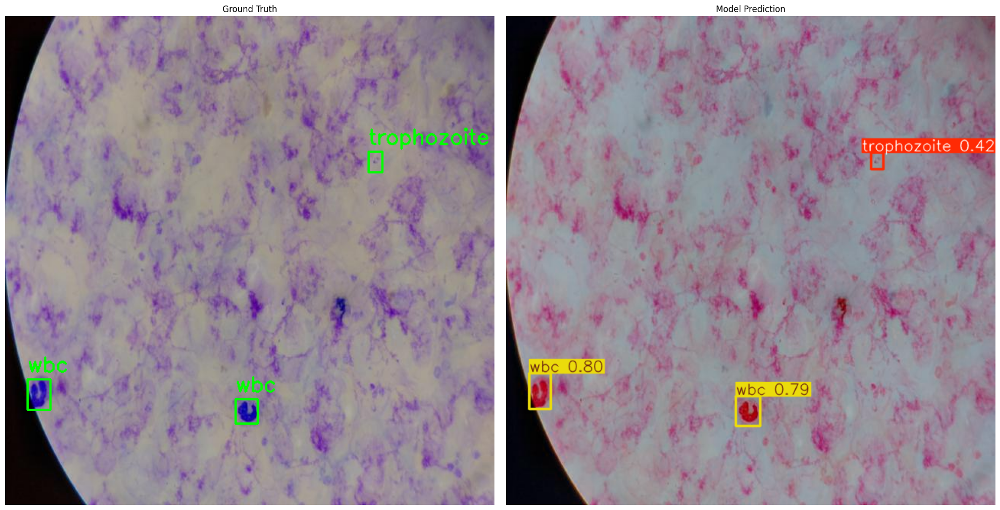

Displayed comparison for image: 1661163916844_jpg.rf.797f7ac39f2d4f16de1d2b3023d69fcb.jpg

image 1/1 /content/Thick-1/test/images/1662557396786_jpg.rf.c022fa44b83218c0e27b16a49258da80.jpg: 640x640 13 trophozoites, 4 wbcs, 37.3ms
Speed: 2.5ms preprocess, 37.3ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)


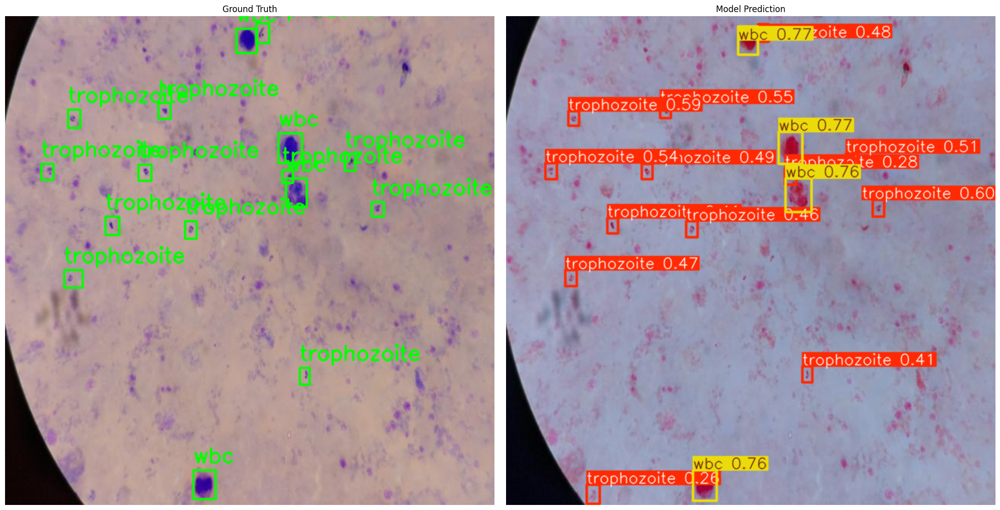

Displayed comparison for image: 1662557396786_jpg.rf.c022fa44b83218c0e27b16a49258da80.jpg

image 1/1 /content/Thick-1/test/images/1661509216587_jpg.rf.cbff6053a2ea88aa75dbafe6d5cdd9ff.jpg: 640x640 6 trophozoites, 3 wbcs, 42.9ms
Speed: 2.0ms preprocess, 42.9ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


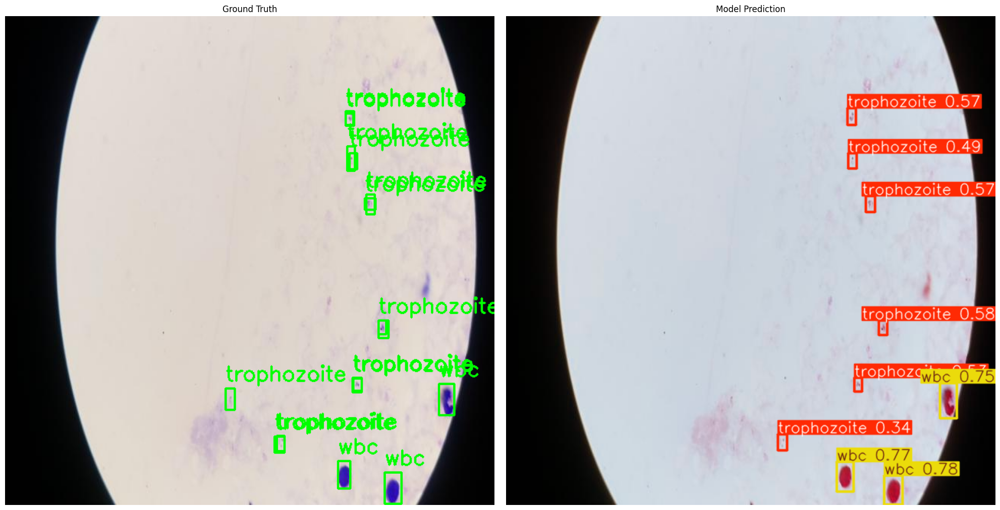

Displayed comparison for image: 1661509216587_jpg.rf.cbff6053a2ea88aa75dbafe6d5cdd9ff.jpg

image 1/1 /content/Thick-1/test/images/1660812573215_jpg.rf.ab59f449657735bb06c4571cb2c45f22.jpg: 640x640 14 trophozoites, 2 wbcs, 37.2ms
Speed: 1.7ms preprocess, 37.2ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


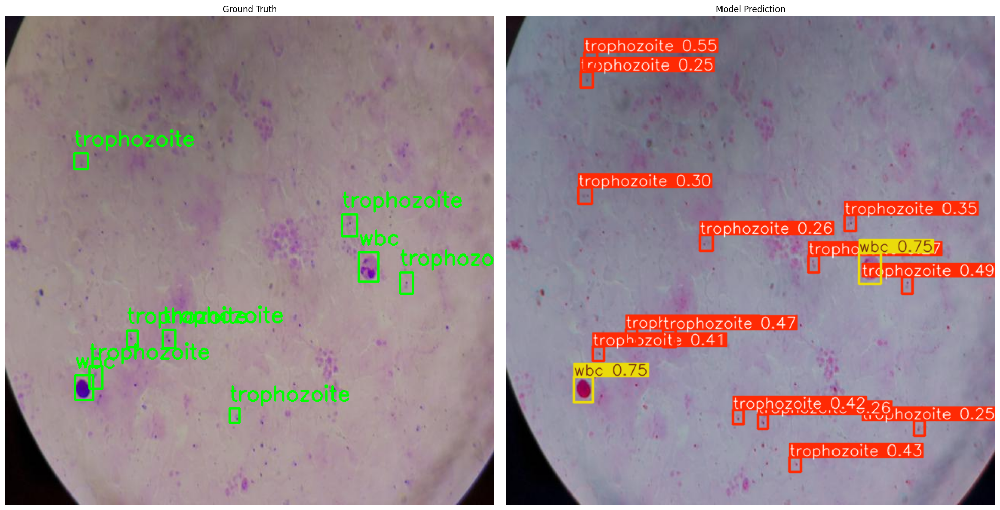

Displayed comparison for image: 1660812573215_jpg.rf.ab59f449657735bb06c4571cb2c45f22.jpg

image 1/1 /content/Thick-1/test/images/1660829042606_jpg.rf.79766b8643189f8f453fc7b1d296a50a.jpg: 640x640 11 trophozoites, 4 wbcs, 38.8ms
Speed: 2.3ms preprocess, 38.8ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


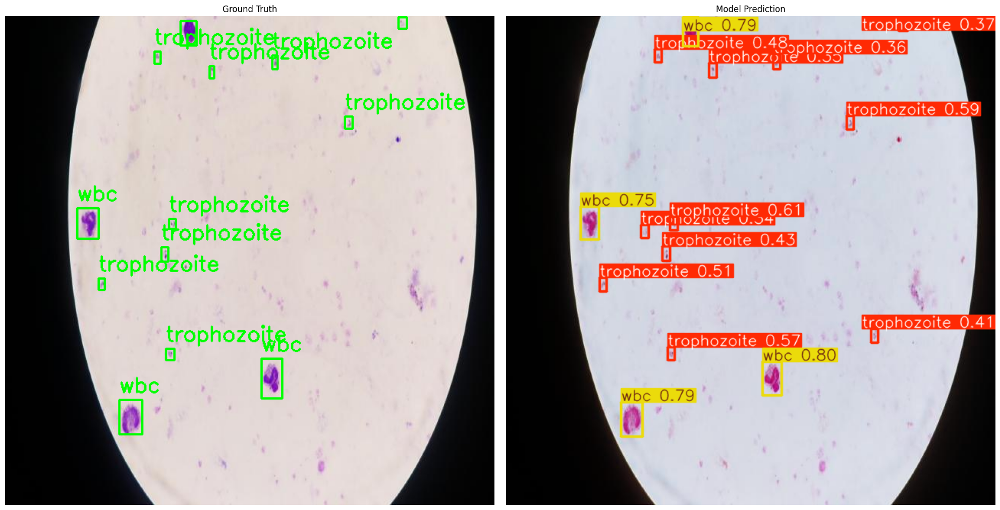

Displayed comparison for image: 1660829042606_jpg.rf.79766b8643189f8f453fc7b1d296a50a.jpg

image 1/1 /content/Thick-1/test/images/1661764016830_jpg.rf.d001a3263097264ecffab9daa0f23b7f.jpg: 640x640 7 trophozoites, 11 wbcs, 37.1ms
Speed: 1.8ms preprocess, 37.1ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


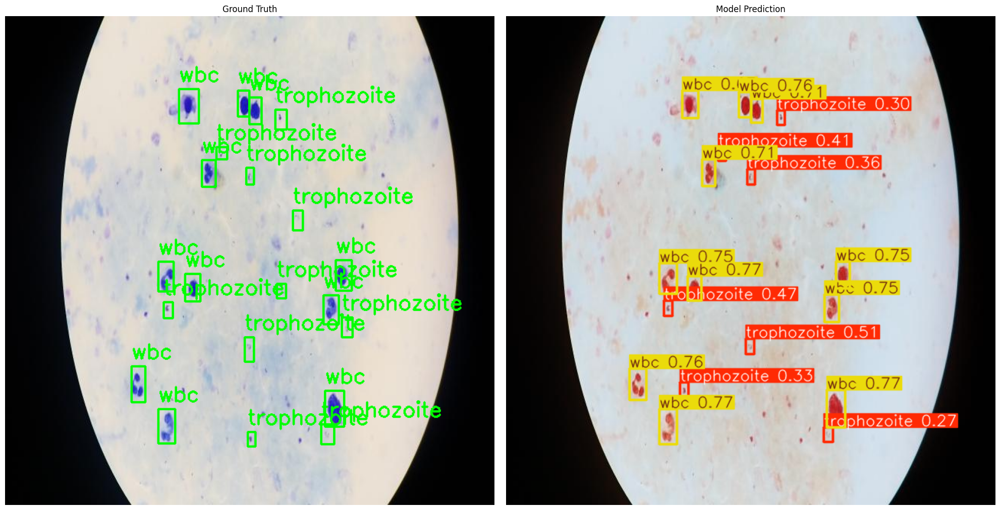

Displayed comparison for image: 1661764016830_jpg.rf.d001a3263097264ecffab9daa0f23b7f.jpg

image 1/1 /content/Thick-1/test/images/1657519006031_jpg.rf.e46eb282810035f42583628eaa6bfdf1.jpg: 640x640 7 trophozoites, 3 wbcs, 37.2ms
Speed: 1.9ms preprocess, 37.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


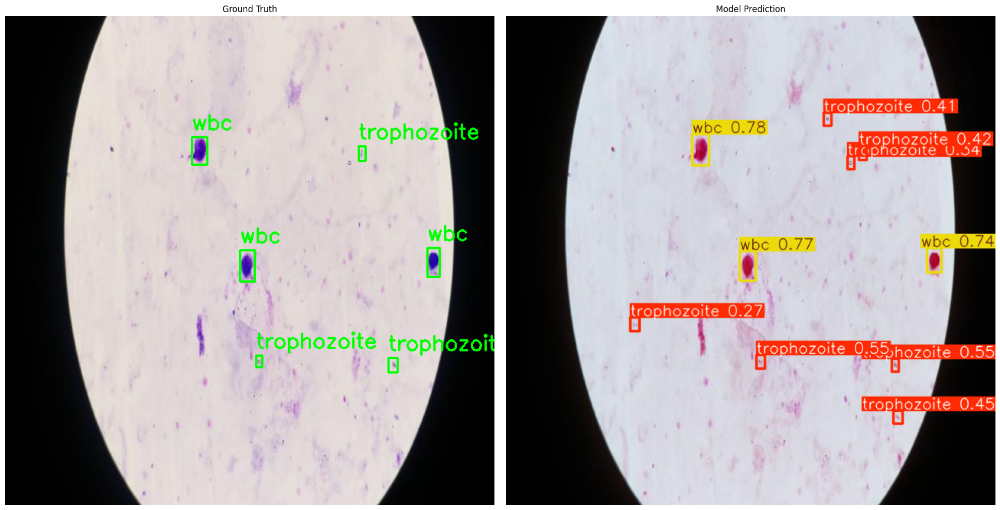

Displayed comparison for image: 1657519006031_jpg.rf.e46eb282810035f42583628eaa6bfdf1.jpg

image 1/1 /content/Thick-1/test/images/1657519218384_jpg.rf.913816e8c948ca6401d6334a12800980.jpg: 640x640 3 trophozoites, 37.1ms
Speed: 2.0ms preprocess, 37.1ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


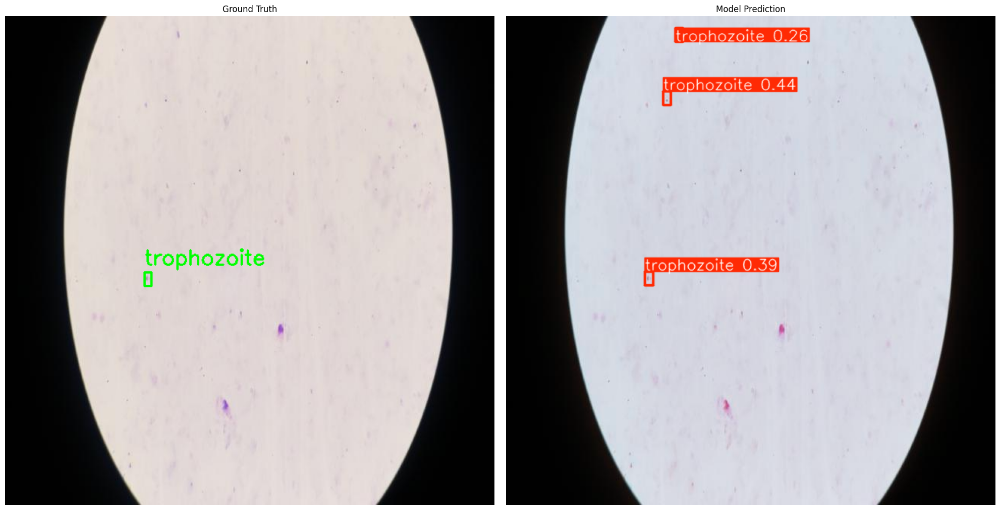

Displayed comparison for image: 1657519218384_jpg.rf.913816e8c948ca6401d6334a12800980.jpg

image 1/1 /content/Thick-1/test/images/1660828994349_jpg.rf.9fc8eccae2d3df52797dfa5920d048df.jpg: 640x640 12 trophozoites, 3 wbcs, 37.2ms
Speed: 1.9ms preprocess, 37.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


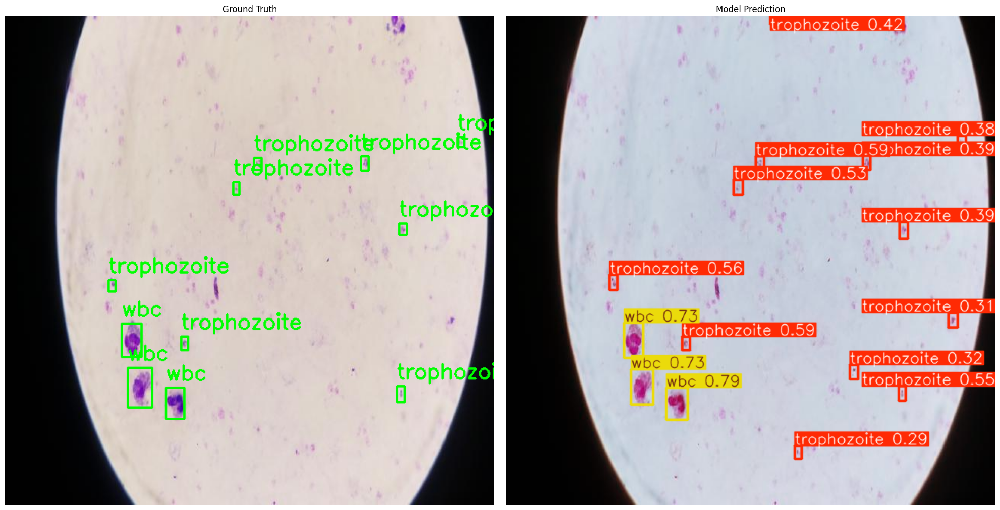

Displayed comparison for image: 1660828994349_jpg.rf.9fc8eccae2d3df52797dfa5920d048df.jpg

image 1/1 /content/Thick-1/test/images/1657262818904_jpg.rf.d72ee5089dad81fcad61572a7812ab4c.jpg: 640x640 2 trophozoites, 2 wbcs, 37.2ms
Speed: 1.8ms preprocess, 37.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


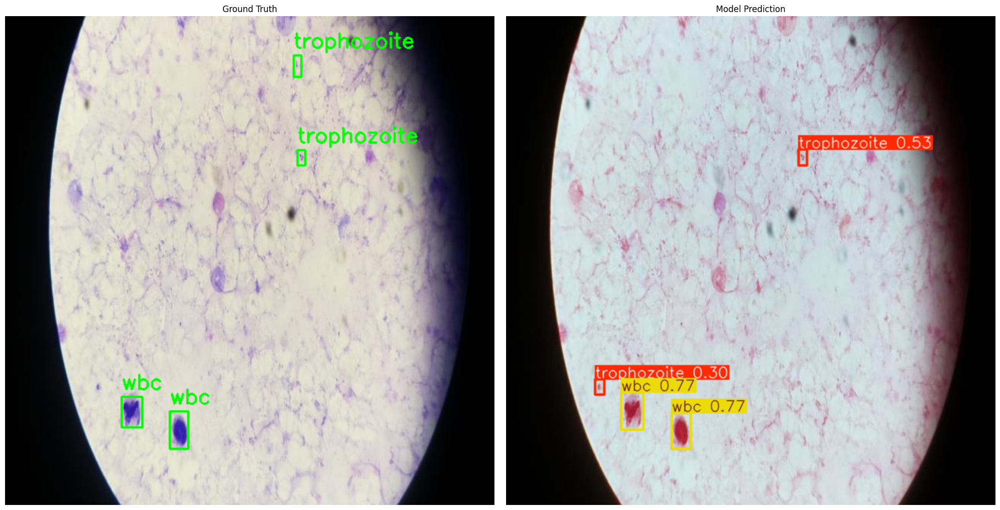

Displayed comparison for image: 1657262818904_jpg.rf.d72ee5089dad81fcad61572a7812ab4c.jpg
All comparisons have been displayed.


In [ ]:
import os
import matplotlib.pyplot as plt
import cv2
import numpy as np
from ultralytics import YOLO

#load_yolo_annotations reads yolo format annotations and converts them into pixel coordinates
def load_yolo_annotations(annotation_path, image_width, image_height):
    boxes = []
    classes = []
    with open(annotation_path, 'r') as f:
  #splits each line into class id and bounding box coordinates
        for line in f:
            class_id, x_center, y_center, width, height = map(float, line.strip().split())
            x = int((x_center - width / 2) * image_width)
            y = int((y_center - height / 2) * image_height)
            w = int(width * image_width)
            h = int(height * image_height)
            boxes.append([x, y, w, h])
            classes.append(int(class_id))
    return boxes, classes

#the draw_boxes fnction draws bounding boxes and labels on an image.
def draw_boxes(img, boxes, classes, class_names, color):
    for box, cls in zip(boxes, classes):
        x, y, w, h = [int(v) for v in box]
        cv2.rectangle(img, (x, y), (x + w, y + h), color, 2)
        label = class_names[cls]
        cv2.putText(img, label, (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, color, 2)
    return img

#The process_and_display_images function processes and dispays the image.
def process_and_display_images(test_folder, model, num_images=10):
    image_folder = os.path.join(test_folder, 'images')
    label_folder = os.path.join(test_folder, 'labels')

    images = [f for f in os.listdir(image_folder) if f.endswith(('.jpg', '.png', '.jpeg'))][:num_images]

    # Get class names from the model
    class_names = model.names

    for img_name in images:
        img_path = os.path.join(image_folder, img_name)
        label_name = os.path.splitext(img_name)[0] + '.txt'
        label_path = os.path.join(label_folder, label_name)

        # Read the original image
        original_img = cv2.imread(img_path)
        original_img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)
        height, width = original_img.shape[:2]

        # Load ground truth boxes and classes
        gt_boxes, gt_classes = load_yolo_annotations(label_path, width, height)

        # Run inference
        results = model(img_path)

        # Plot results
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))

        # Draw ground truth boxes
        gt_img = original_img.copy()
        gt_img = draw_boxes(gt_img, gt_boxes, gt_classes, class_names, (0, 255, 0))  # Green for ground truth
        ax1.imshow(gt_img)
        ax1.set_title('Ground Truth')
        ax1.axis('off')

        # Use the plot method from results
        ax2.imshow(results[0].plot())
        ax2.set_title('Model Prediction')
        ax2.axis('off')

        plt.tight_layout()
        plt.show()

        print(f"Displayed comparison for image: {img_name}")

# Load your trained model
model = YOLO('/content/runs/detect/train/weights/best.pt')

# Directory containing your test images and labels folders
test_dir = '/content/Thick-1/test'

# Process and display images
process_and_display_images(test_dir, model)

print("All comparisons have been displayed.")